# Surface Crack Detection

We classify the surface cracks using 3 differenct base models with transfer learning:
* ResNet v2
* VGG16
* Xception

Finally, we will display the activation maps using Grad-Cam.

Enjoy the notebook and feedback greatly appreciated.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# You should use mixed precision if you use TPUs or NVIDIA GPUs with at least compute capability 7.0, as it will improve performance by up to 3x.
# With this policy, layers use float16 computations and float32 variables. Computations are done in float16 for performance, but variables must be kept in float32 for numeric stability.
# IMPORTANT : A softmax activation at the end of the model should be float32.
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

# Overall Settings

In [2]:
FINE_TUNING_EPOCHS = 3
TRAINING_EPOCHS = 3
BATCH_SIZE = 32

image_height = 224 
image_width = 224
i_iteration = 1

# Load data

In [3]:
from tensorflow.keras.utils import image_dataset_from_directory

base_dir = "/kaggle/input/surface-crack-detection/"

base_dataset = image_dataset_from_directory(
    base_dir,
    image_size = (image_height, image_width),
    crop_to_aspect_ratio = True,
    shuffle = False,
    batch_size = 32)

Found 40000 files belonging to 2 classes.


In [4]:
base_df = pd.DataFrame(base_dataset.file_paths.copy())
base_df.columns = ['fullpaths']
base_df['labels'] = base_df.apply(lambda x: base_dataset.class_names[1] if (base_dataset.class_names[1] in x.fullpaths)  else base_dataset.class_names[0], axis=1)
base_df['filepaths'] = base_df.apply(lambda x: str(x.fullpaths).replace(base_dir, ''), axis=1)

In [5]:
pd.set_option('display.max_colwidth', None)

In [6]:
base_df.head(10)

,fullpaths,labels,filepaths
0,/kaggle/input/surface-crack-detection/Negative/00001.jpg,Negative,Negative/00001.jpg
1,/kaggle/input/surface-crack-detection/Negative/00002.jpg,Negative,Negative/00002.jpg
2,/kaggle/input/surface-crack-detection/Negative/00003.jpg,Negative,Negative/00003.jpg
3,/kaggle/input/surface-crack-detection/Negative/00004.jpg,Negative,Negative/00004.jpg
4,/kaggle/input/surface-crack-detection/Negative/00005.jpg,Negative,Negative/00005.jpg
5,/kaggle/input/surface-crack-detection/Negative/00006.jpg,Negative,Negative/00006.jpg
6,/kaggle/input/surface-crack-detection/Negative/00007.jpg,Negative,Negative/00007.jpg
7,/kaggle/input/surface-crack-detection/Negative/00008.jpg,Negative,Negative/00008.jpg
8,/kaggle/input/surface-crack-detection/Negative/00009.jpg,Negative,Negative/00009.jpg
9,/kaggle/input/surface-crack-detection/Negative/00010.jpg,Negative,Negative/00010.jpg


In [7]:
freq = base_df['labels'].value_counts()
print(freq)

Negative    20000
Positive    20000
Name: labels, dtype: int64


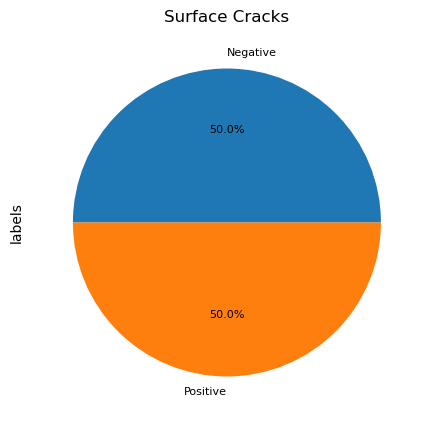

In [8]:
freq.plot(kind='pie',figsize=(5,5),title='Surface Cracks',autopct='%1.1f%%',shadow = False,  fontsize=8);

In [9]:
# 60% - train set,
# 20% - validation set,
# 20% - test set

train_df, valid_df, test_df = np.split(base_df.sample(frac=1, random_state=42), [int(.6*len(base_df)), int(.8*len(base_df))])

# Data Generators

In [10]:
# deep learning libraries
import tensorflow as tf
import keras
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import applications
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout
from keras.preprocessing import image

In [11]:
# Data agumentation and pre-processing using tensorflow
gen = ImageDataGenerator(rescale         = 1./255.,
                         horizontal_flip = True,
                         vertical_flip   = True,
                         zoom_range      = 0.05,
                         rotation_range  = 25)
 
train_generator = gen.flow_from_dataframe(
    train_df, # dataframe
    directory = base_dir, # images data path / folder in which images are there
    x_col = 'filepaths',
    y_col = 'labels',
    color_mode = "rgb",
    target_size = (image_height, image_width), # image height , image width
    class_mode = "categorical",
    batch_size = BATCH_SIZE,
    shuffle = True,
    seed = 42)

Found 24000 validated image filenames belonging to 2 classes.


In [12]:
# Data agumentation and pre-processing using tensorflow
test_gen = ImageDataGenerator(rescale = 1./255.)

validation_generator = test_gen.flow_from_dataframe(
    valid_df, # dataframe
    directory   = base_dir, # images data path / folder in which images are there
    x_col       = 'filepaths',
    y_col       = 'labels',
    color_mode  ="rgb",
    target_size = (image_height, image_width), # image height , image width
    class_mode  = "categorical",
    batch_size  = BATCH_SIZE,
    shuffle     = True,
    seed        = 42)

test_generator = test_gen.flow_from_dataframe(
    test_df, # dataframe
    directory   = base_dir, # images data path / folder in which images are there
    x_col       = 'filepaths',
    y_col       = 'labels',
    color_mode  = "rgb",
    target_size = (image_height, image_width), # image height , image width
    class_mode  = "categorical",
    batch_size  = BATCH_SIZE,
    shuffle     = False)

Found 8000 validated image filenames belonging to 2 classes.
Found 8000 validated image filenames belonging to 2 classes.


In [13]:
# Get labels in dataset
a = train_generator.class_indices
class_names = list(a.keys())  # storing class/breed names in a list

In [14]:
class_names

['Negative', 'Positive']

In [15]:
# Define function to plot some images
import matplotlib.pyplot as plt

def plot_images(img, true_labels, predictions = None):
    plt.figure(figsize=[12, 18])
    for i in range(24):
        plt.subplot(6, 4, i+1)
        plt.imshow(img[i])
        plt.axis('off')
        if (predictions is not None):
            plt.title("{}\n {} {:.1f}%".format(class_names[np.argmax(true_labels[i])], class_names[np.argmax(predictions[i])], 100 * np.max(predictions[i])))
        else:
            plt.title(class_names[np.argmax(true_labels[i])])    

# Sample Images

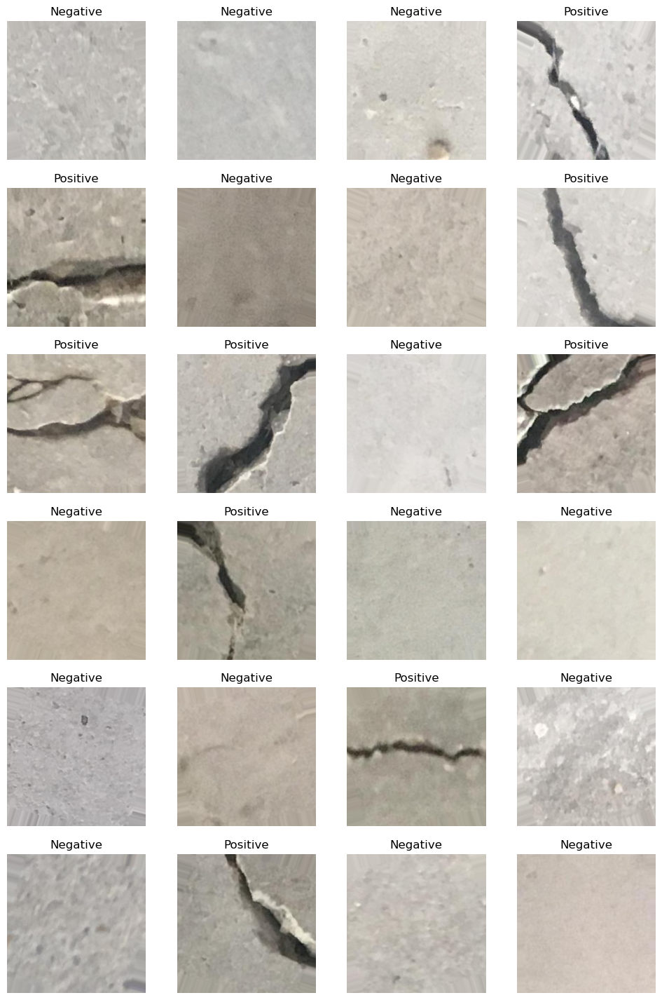

In [16]:
x,y = next(train_generator)
plot_images(x,y)

In [17]:
# function to plote training history
def plot_history(history):
    # store results
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    # plot results
    # accuracy
    plt.figure(figsize=(5, 8))
    plt.rcParams['figure.figsize'] = [8, 4]
    plt.rcParams['font.size'] = 10
    plt.rcParams['axes.grid'] = True
    plt.rcParams['figure.facecolor'] = 'white'
    plt.subplot(2, 1, 1)
    plt.plot(acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.ylabel('Accuracy')
    plt.title(f'\nTraining and Validation Accuracy. \nTrain Accuracy: {str(round(acc[-1],3))}\nValidation Accuracy: {str(round(val_acc[-1],3))}')
    
    # loss
    plt.subplot(2, 1, 2)
    plt.plot(loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.ylabel('Cross Entropy')
    plt.title(f'Training and Validation Loss. \nTrain Loss: {str(round(loss[-1],3))}\nValidation Loss: {str(round(val_loss[-1],3))}')
    plt.xlabel('epoch')
    plt.tight_layout(pad=3.0)
    plt.show()

In [18]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_heatmap(y_true, y_pred, class_names, ax, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(
        cm, 
        annot=True, 
        square=True, 
        xticklabels=class_names, 
        yticklabels=class_names,
        fmt='d', 
        cmap=plt.cm.Blues,
        cbar=False,
        ax=ax)
    ax.set_title(title, fontsize = 12)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, ha = "right")
    ax.set_ylabel('True Label', fontsize= 10)
    ax.set_xlabel('Predicted Label', fontsize = 10)

# Grad-Cam

In [19]:
from matplotlib import cm

def make_gradcam_heatmap(image, model, last_conv_layer_name):
 
    img_array = tf.expand_dims(image, axis=0)
    
    # Remove last layer's softmax
    last_layer_activation = model.layers[-1].activation
    model.layers[-1].activation = None

    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    heatmap = heatmap.numpy()  
    
    
     # We rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # We use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # We use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # We create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img_array[0].shape[1], img_array[0].shape[0]))
    jet_heatmap = tf.keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * 0.4 + img_array[0] * 255 

    superimposed_img = tf.keras.utils.array_to_img(superimposed_img)
    
    # Restore last layer activation
    model.layers[-1].activation = last_layer_activation
    
    return superimposed_img

# Model

In [20]:
from tensorflow.keras.models import Model

def create_model(base_model):
    
    x = base_model.output    
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation = 'relu')(x)
    x = Dropout(0.4)(x)
    x = Dense(64, activation = 'relu')(x)
    x = Dropout(0.2)(x)
    
    outputs = Dense(len(class_names), activation='softmax')(x)
    
    model = Model(base_model.inputs, outputs)
    
    return model  

In [21]:
def fit_model(model, base_model, epochs, fine_tune = 0, i_iteration=0):
    
    early = tf.keras.callbacks.EarlyStopping( patience = 10,
                                              min_delta = 0.001,
                                              restore_best_weights = True)
    # early stopping call back
    
    # Defines how many layers to freeze during training.
    # Layers in the convolutional base are switched from trainable to non-trainable
    # depending on the size of the fine-tuning parameter.
    
    print("Unfreezing number of layers in base model = ", fine_tune)
    
    if fine_tune > 0:
        base_model.trainable = True
        for layer in base_model.layers[:-fine_tune]:
            layer.trainable = False       
        # small learning rate for fine tuning
        model.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
    else:
        base_model.trainable = False
        model.compile(optimizer=tf.keras.optimizers.Adam(),
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
       
    # categorical cross entropy is taken since its used as a loss function for
    # multi-class classification problems where there are two or more output labels.
    # using Adam optimizer for better performance
    # other optimizers such as sgd can also be used depending upon the model

    # fit model
    history = model.fit(train_generator,
                        validation_data = validation_generator,
                        epochs = epochs,
                        callbacks = [early])
    
   # model.save(f'model_{i_iteration}.h5')
    i_iteration = i_iteration + 1
    return history

# Resnet v2

In [22]:
# load the InceptionResNetV2 architecture with imagenet weights as base
inception_base_model = tf.keras.applications.InceptionResNetV2(
                     include_top = False,
                     weights = 'imagenet',
                     input_shape = (image_height, image_width, 3)
                     )

# For freezing the layer we make use of layer.trainable = False
# means that its internal state will not change during training.
# model's trainable weights will not be updated during fit(),
# and also its state updates will not run.
inception_model = create_model(inception_base_model)
# inception_model.summary()
history = fit_model(inception_model, inception_base_model, epochs = TRAINING_EPOCHS)

219055592/219055592 [==============================] - 9s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/3
750/750 [==============================] - 515s 662ms/step - loss: 0.0402 - accuracy: 0.9868 - val_loss: 0.0089 - val_accuracy: 0.9971
Epoch 2/3
750/750 [==============================] - 326s 434ms/step - loss: 0.0233 - accuracy: 0.9924 - val_loss: 0.0094 - val_accuracy: 0.9973
Epoch 3/3
750/750 [==============================] - 328s 437ms/step - loss: 0.0209 - accuracy: 0.9938 - val_loss: 0.0127 - val_accuracy: 0.9950


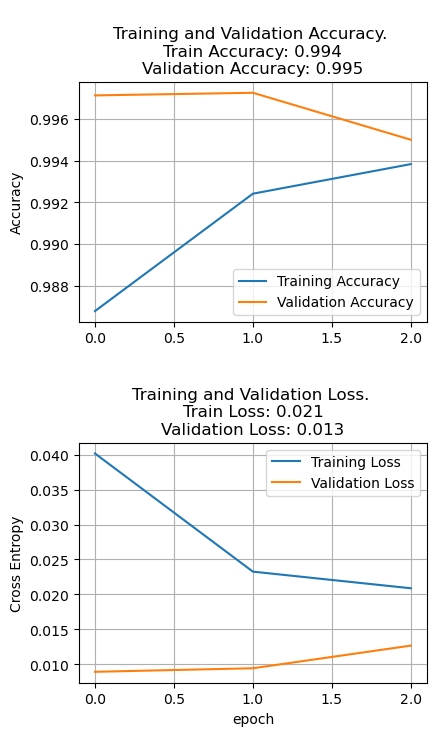

In [23]:
plot_history(history)

In [24]:
# Unfreeze the base_model
nr_base_layers = len(inception_base_model.layers)
print("Inception base layers = ", nr_base_layers)    

history = fit_model(inception_model, inception_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

Inception base layers =  780
Unfreezing number of layers in base model =  195
Epoch 1/3
750/750 [==============================] - 381s 468ms/step - loss: 0.0220 - accuracy: 0.9936 - val_loss: 0.0039 - val_accuracy: 0.9992
Epoch 2/3
750/750 [==============================] - 337s 449ms/step - loss: 0.0089 - accuracy: 0.9973 - val_loss: 0.0033 - val_accuracy: 0.9992
Epoch 3/3
750/750 [==============================] - 343s 457ms/step - loss: 0.0067 - accuracy: 0.9977 - val_loss: 0.0036 - val_accuracy: 0.9990


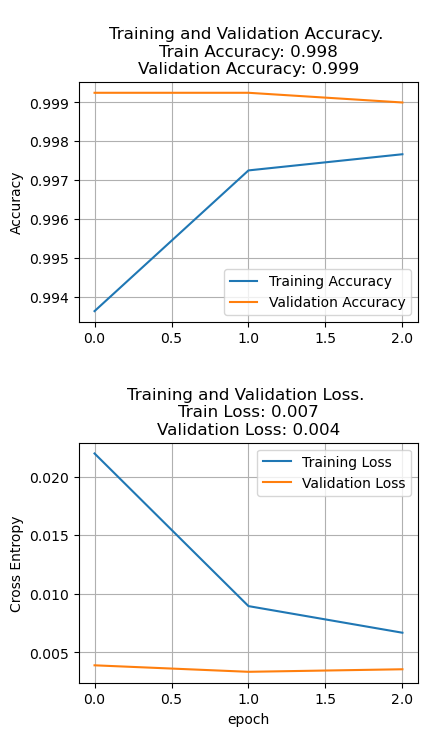

In [25]:
 plot_history(history)

In [26]:
accuracy_score = inception_model.evaluate(validation_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

250/250 [==============================] - 29s 117ms/step - loss: 0.0036 - accuracy: 0.9990
[0.0035543744452297688, 0.9990000128746033]
Accuracy: 99.90%
Loss: 0.004


In [27]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming you have already created your test generator
test_generator.reset()

# Get predictions from the model
predictions_inception_model = inception_model.predict(test_generator)


# Convert predictions to classes (assuming binary classification)
predicted_classes = predictions_inception_model.argmax(axis=-1)

# Get true labels from the generator
true_classes = test_generator.classes

# Calculate metrics
accuracy = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average='weighted')
recall = recall_score(true_classes, predicted_classes, average='weighted')
f1 = f1_score(true_classes, predicted_classes, average='weighted')

# Confusion Matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("Confusion Matrix:")
print(conf_matrix)



250/250 [==============================] - 79s 301ms/step
Accuracy: 0.99825
Precision: 0.9982501184441626
Recall: 0.99825
F1-score: 0.9982499968279582
Confusion Matrix:
[[4022    6]
 [   8 3964]]


In [30]:
inception_model.save("inception_model1.h5")

AttributeError: 'LossScaleOptimizerV3' object has no attribute '_variables'

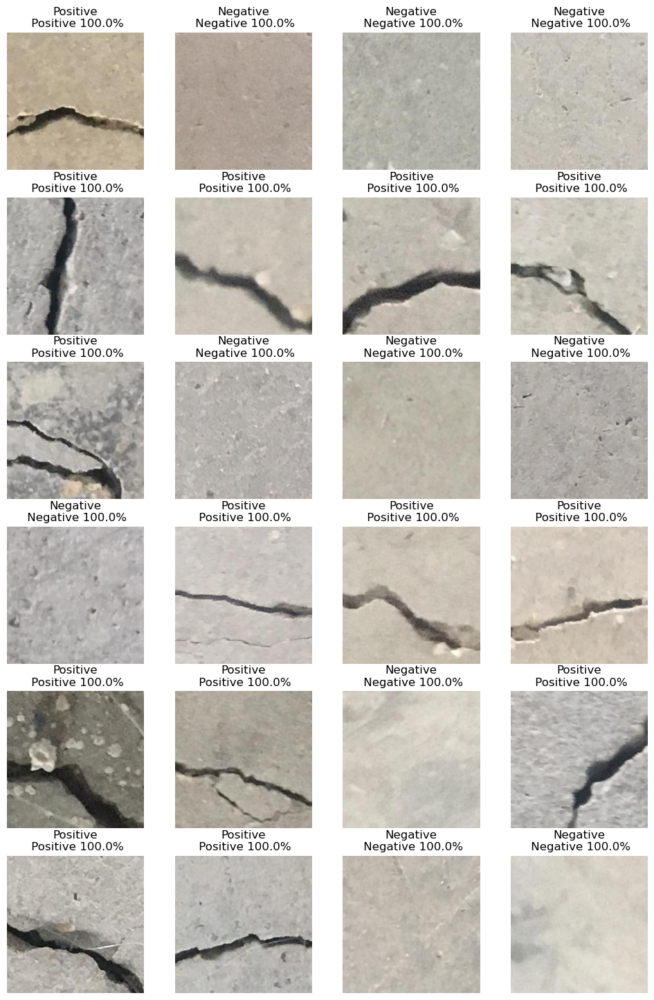

In [32]:
test_generator.reset()
x, y = next(test_generator)
plot_images(x, y, predictions_inception_model)

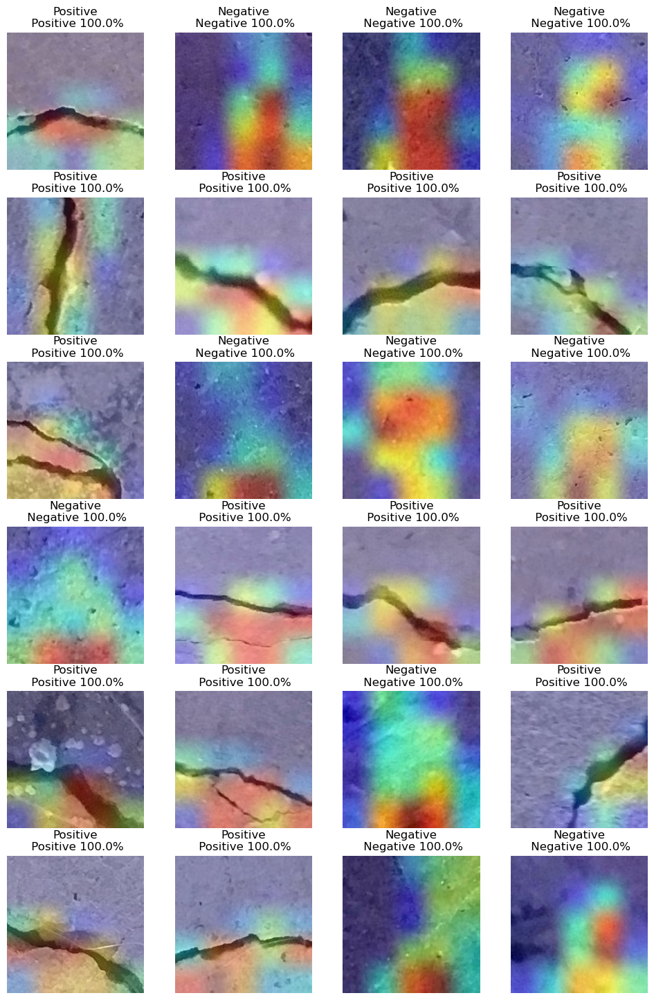

In [33]:
last_conv_layer_name = "conv_7b_ac"

heatmaps =[]

for img in x:
    heatmap = make_gradcam_heatmap(img, inception_model, last_conv_layer_name)
    heatmaps.append(heatmap)
    
plot_images(heatmaps, y, predictions_inception_model)

# VGG16

In [34]:
# load the VGG16 architecture with imagenet weights as base
vgg16_base_model = tf.keras.applications.vgg16.VGG16(
                             include_top = False,
                             weights = 'imagenet',
                             input_shape = (image_height, image_width, 3)
                             )

# For freezing the layer we make use of layer.trainable = False
# means that its internal state will not change during training.
# model's trainable weights will not be updated during fit(),
# and also its state updates will not run.
vgg16_model = create_model(vgg16_base_model)
#vgg16_model.summary()
history = fit_model(vgg16_model, vgg16_base_model, epochs = TRAINING_EPOCHS)

58889256/58889256 [==============================] - 3s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/3
750/750 [==============================] - 332s 436ms/step - loss: 0.0748 - accuracy: 0.9715 - val_loss: 0.0226 - val_accuracy: 0.9927
Epoch 2/3
750/750 [==============================] - 318s 424ms/step - loss: 0.0244 - accuracy: 0.9935 - val_loss: 0.0153 - val_accuracy: 0.9948
Epoch 3/3
750/750 [==============================] - 323s 431ms/step - loss: 0.0206 - accuracy: 0.9938 - val_loss: 0.0183 - val_accuracy: 0.9950


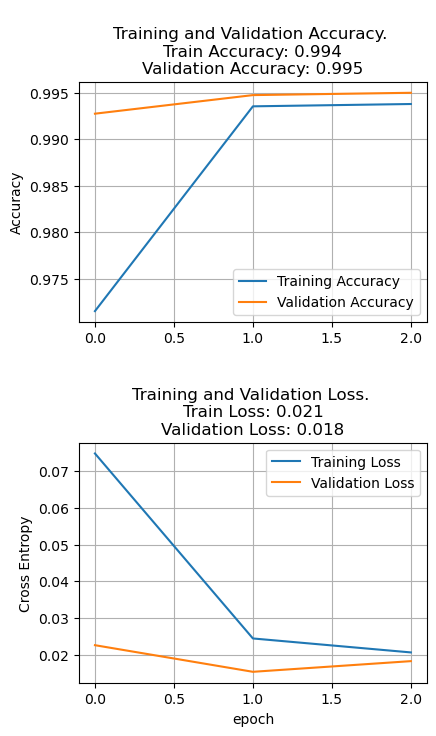

In [35]:
plot_history(history)

In [36]:
# Unfreeze the base_model. Note that it keeps running in inference mode
# since we passed `training=False` when calling it. This means that
# the batchnorm layers will not update their batch statistics.
# This prevents the batchnorm layers from undoing all the training
# we've done so far.
nr_base_layers = len(vgg16_base_model.layers)
print("VGG16 base layers = ", nr_base_layers)    

history = fit_model(vgg16_model, vgg16_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

VGG16 base layers =  19
Unfreezing number of layers in base model =  4
Epoch 1/3
750/750 [==============================] - 328s 433ms/step - loss: 0.0145 - accuracy: 0.9957 - val_loss: 0.0079 - val_accuracy: 0.9971
Epoch 2/3
750/750 [==============================] - 314s 418ms/step - loss: 0.0095 - accuracy: 0.9974 - val_loss: 0.0124 - val_accuracy: 0.9971
Epoch 3/3
750/750 [==============================] - 318s 423ms/step - loss: 0.0073 - accuracy: 0.9980 - val_loss: 0.0084 - val_accuracy: 0.9966


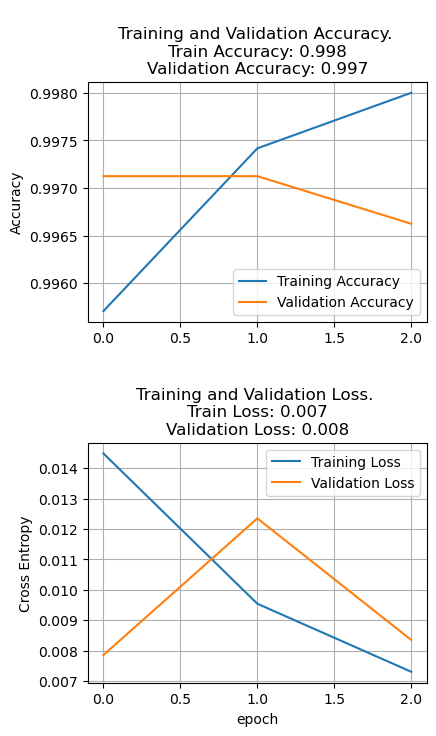

In [37]:
plot_history(history)

In [38]:
accuracy_score = vgg16_model.evaluate(validation_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

250/250 [==============================] - 24s 94ms/step - loss: 0.0084 - accuracy: 0.9966
[0.008352159522473812, 0.9966250061988831]
Accuracy: 99.66%
Loss: 0.008


In [39]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming you have already created your test generator
test_generator.reset()

# Get predictions from the model
predictions_vgg16 =  vgg16_model.predict(test_generator)

# Convert predictions to classes (assuming binary classification)
predicted_classes = predictions_vgg16.argmax(axis=-1)

# Get true labels from the generator
true_classes = test_generator.classes

# Calculate metrics
accuracy = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average='weighted')
recall = recall_score(true_classes, predicted_classes, average='weighted')
f1 = f1_score(true_classes, predicted_classes, average='weighted')

# Confusion Matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("Confusion Matrix:")
print(conf_matrix)


250/250 [==============================] - 29s 115ms/step
Accuracy: 0.996625
Precision: 0.9966442551382927
Recall: 0.996625
F1-score: 0.9966248932019421
Confusion Matrix:
[[4027    1]
 [  26 3946]]


In [40]:
vgg16_model.save("vgg16_model1.h5")

AttributeError: 'LossScaleOptimizerV3' object has no attribute '_variables'

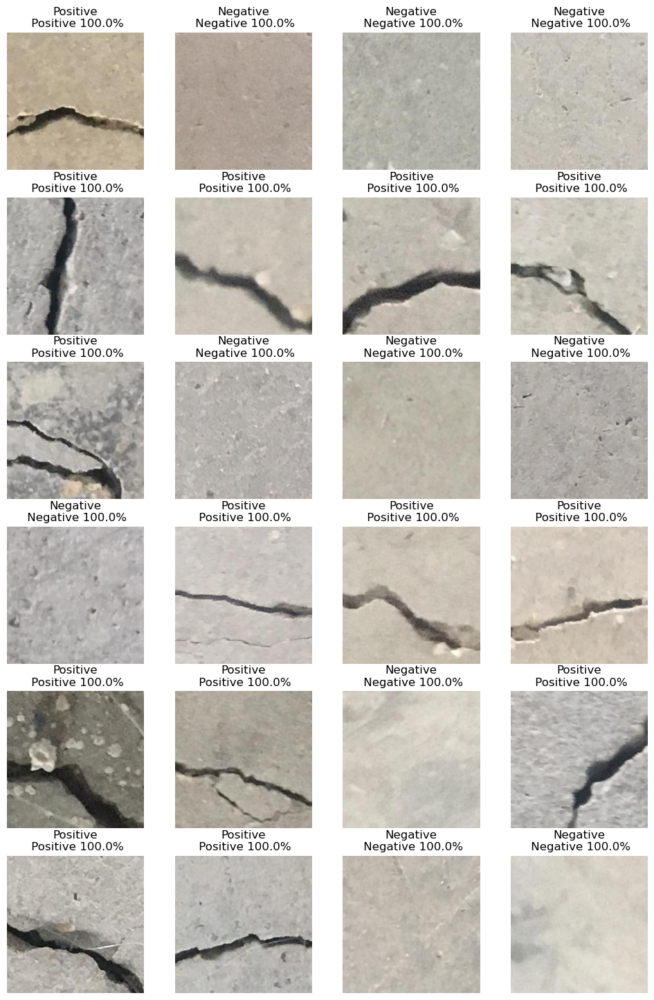

In [41]:
test_generator.reset()
x,y = next(test_generator)
plot_images(x, y, predictions_vgg16)

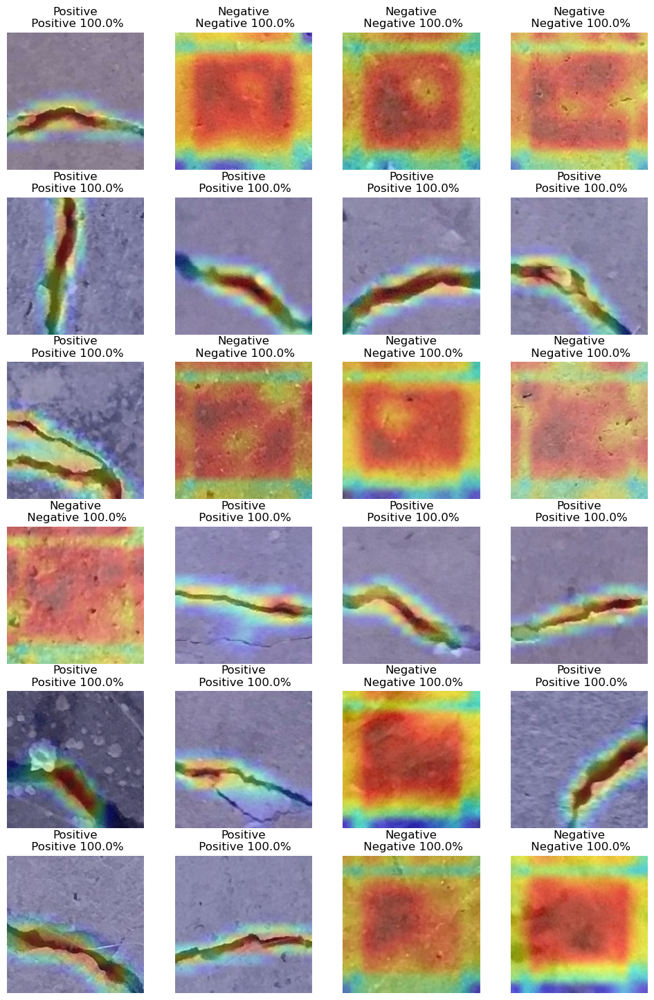

In [42]:
last_conv_layer_name = "block5_conv3"

heatmaps =[]

for img in x:
    heatmap = make_gradcam_heatmap(img, vgg16_model, last_conv_layer_name)
    heatmaps.append(heatmap)
    
plot_images(heatmaps, y, predictions_vgg16)

# Xception

In [43]:
# load the xception architecture with imagenet weights as base
xception_base_model = tf.keras.applications.xception.Xception(
                                 include_top = False,
                                 weights = 'imagenet',
                                 input_shape = (image_height, image_width, 3)
                                 )

# For freezing the layer we make use of layer.trainable = False
# means that its internal state will not change during training.
# model's trainable weights will not be updated during fit(),
# and also its state updates will not run.
xception_model = create_model(xception_base_model)
#xception_model.summary()
history = fit_model(xception_model, xception_base_model, epochs = TRAINING_EPOCHS)

83683744/83683744 [==============================] - 4s 0us/step
Unfreezing number of layers in base model =  0
Epoch 1/3
750/750 [==============================] - 321s 419ms/step - loss: 0.0417 - accuracy: 0.9856 - val_loss: 0.0115 - val_accuracy: 0.9966
Epoch 2/3
750/750 [==============================] - 315s 420ms/step - loss: 0.0208 - accuracy: 0.9938 - val_loss: 0.0104 - val_accuracy: 0.9970
Epoch 3/3
750/750 [==============================] - 321s 428ms/step - loss: 0.0166 - accuracy: 0.9946 - val_loss: 0.0099 - val_accuracy: 0.9971


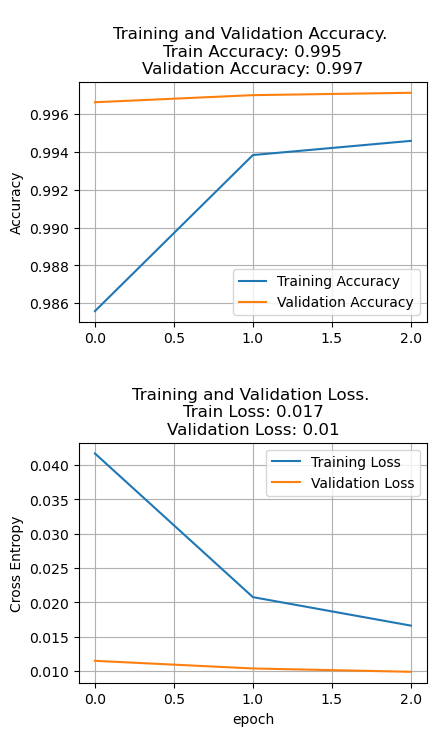

In [44]:
plot_history(history)

In [45]:
# Unfreeze the base_model. Note that it keeps running in inference mode
# since we passed `training=False` when calling it. This means that
# the batchnorm layers will not update their batch statistics.
# This prevents the batchnorm layers from undoing all the training
# we've done so far.
nr_base_layers = len(xception_base_model.layers)
print("xception base layers = ", nr_base_layers)    

history = fit_model(xception_model, xception_base_model, epochs = FINE_TUNING_EPOCHS, fine_tune = int(nr_base_layers/4))

xception base layers =  132
Unfreezing number of layers in base model =  33
Epoch 1/3
750/750 [==============================] - 338s 438ms/step - loss: 0.0306 - accuracy: 0.9911 - val_loss: 0.0062 - val_accuracy: 0.9981
Epoch 2/3
750/750 [==============================] - 321s 428ms/step - loss: 0.0148 - accuracy: 0.9957 - val_loss: 0.0055 - val_accuracy: 0.9985
Epoch 3/3
750/750 [==============================] - 321s 428ms/step - loss: 0.0110 - accuracy: 0.9967 - val_loss: 0.0071 - val_accuracy: 0.9980


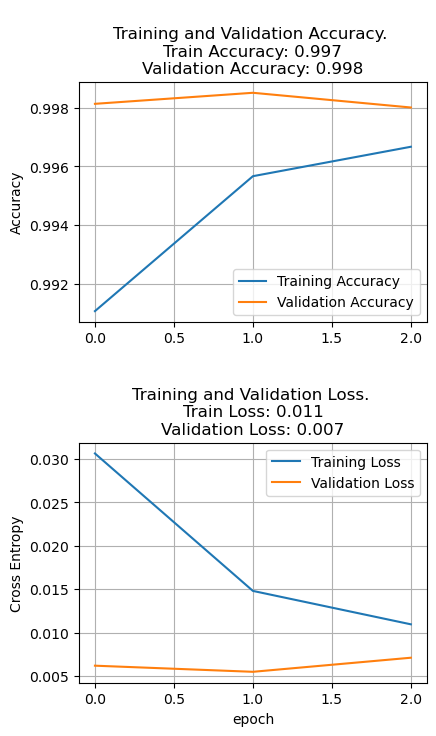

In [46]:
plot_history(history)

In [47]:
accuracy_score = xception_model.evaluate(validation_generator)

print(accuracy_score)
print("Accuracy: {:.2f}%".format(accuracy_score[1] * 100))
print("Loss: {:.3f}".format(accuracy_score[0]))

250/250 [==============================] - 26s 104ms/step - loss: 0.0071 - accuracy: 0.9980
[0.007118795532733202, 0.9980000257492065]
Accuracy: 99.80%
Loss: 0.007


In [48]:
# Perform predictions to allow computation of the confusion matrix later on
# Do not shuffle predictions otherwise we have no way of finding out the true labels

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming you have already created your test generator
test_generator.reset()

# Get predictions from the model
predictions_xception = xception_model.predict(test_generator)

# Convert predictions to classes (assuming binary classification)
predicted_classes = predictions_xception.argmax(axis=-1)

# Get true labels from the generator
true_classes = test_generator.classes

# Calculate metrics
accuracy = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average='weighted')
recall = recall_score(true_classes, predicted_classes, average='weighted')
f1 = f1_score(true_classes, predicted_classes, average='weighted')

# Confusion Matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("Confusion Matrix:")
print(conf_matrix)


250/250 [==============================] - 31s 120ms/step
Accuracy: 0.99775
Precision: 0.9977545270724332
Recall: 0.99775
F1-score: 0.9977500185630616
Confusion Matrix:
[[4013   15]
 [   3 3969]]


In [49]:
xception_model.save("xception_model1.h5")

AttributeError: 'LossScaleOptimizerV3' object has no attribute '_variables'

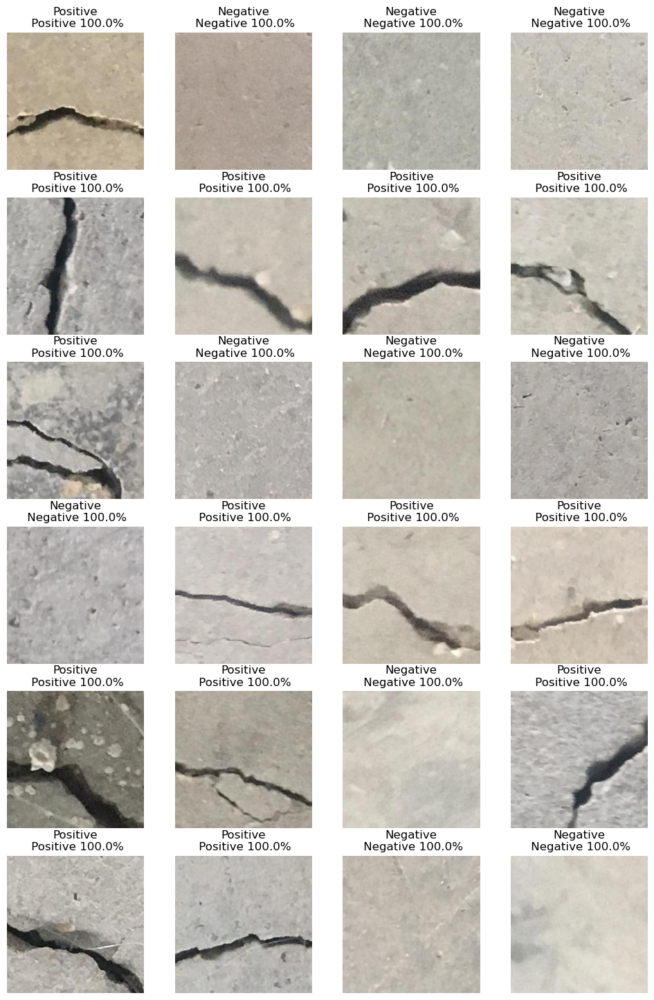

In [50]:
test_generator.reset()
x, y = next(test_generator)
plot_images(x, y, predictions_xception)

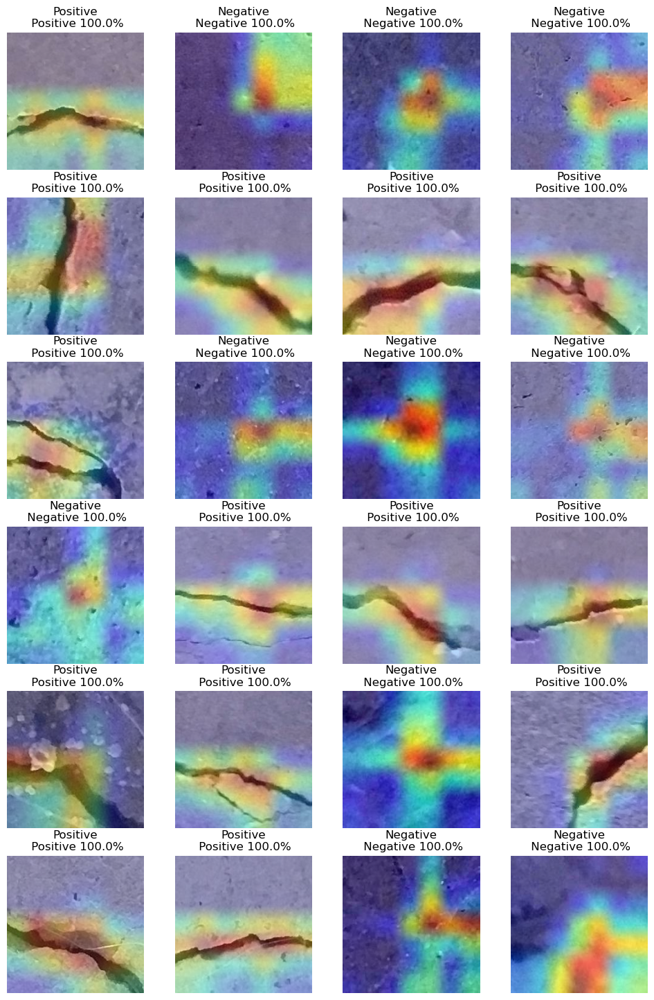

In [51]:
last_conv_layer_name = "block14_sepconv2_act"

heatmaps = []

for img in x:
    heatmap = make_gradcam_heatmap(img, xception_model, last_conv_layer_name)
    heatmaps.append(heatmap)
    
plot_images(heatmaps, y, predictions_xception)

# Confusion Matrix

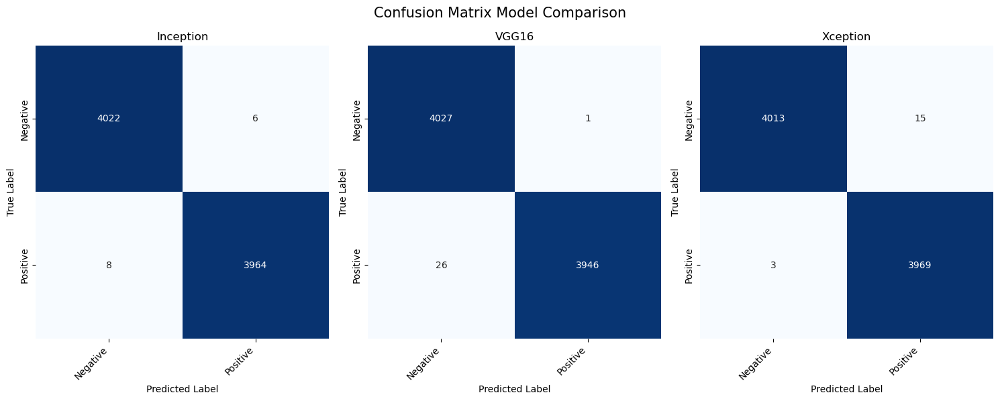

In [55]:
# Display confusion matrix
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 8))

true_classes = test_generator.classes
predictions_inception_classes = predictions_inception_model.argmax(axis=-1)
predictions_vgg16_classes = predictions_vgg16.argmax(axis=-1)
predictions_xception_classes = predictions_xception.argmax(axis=-1)
plot_heatmap(true_classes, predictions_inception_classes, class_names, ax1, title = "Inception")    
plot_heatmap(true_classes, predictions_vgg16_classes, class_names, ax2, title = "VGG16")    
plot_heatmap(true_classes, predictions_xception_classes, class_names, ax3, title = "Xception")    

fig.suptitle("Confusion Matrix Model Comparison", fontsize = 15)
fig.tight_layout()
fig.subplots_adjust(top=1.25)
plt.show()

# Ensemble

In [56]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Assuming you have already created your test generator
test_generator.reset()

# Get predictions from the model
ensemble_preds = np.add(np.add(predictions_inception_model, predictions_vgg16), predictions_xception)/3.0
# Convert predictions to classes (assuming binary classification)
predicted_classes = ensemble_preds.argmax(axis=-1)

# Get true labels from the generator
true_classes = test_generator.classes

# Calculate metrics
accuracy = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average='weighted')
recall = recall_score(true_classes, predicted_classes, average='weighted')
f1 = f1_score(true_classes, predicted_classes, average='weighted')

# Confusion Matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.99925
Precision: 0.9992501221943734
Recall: 0.99925
F1-score: 0.9992499986405535
Confusion Matrix:
[[4026    2]
 [   4 3968]]


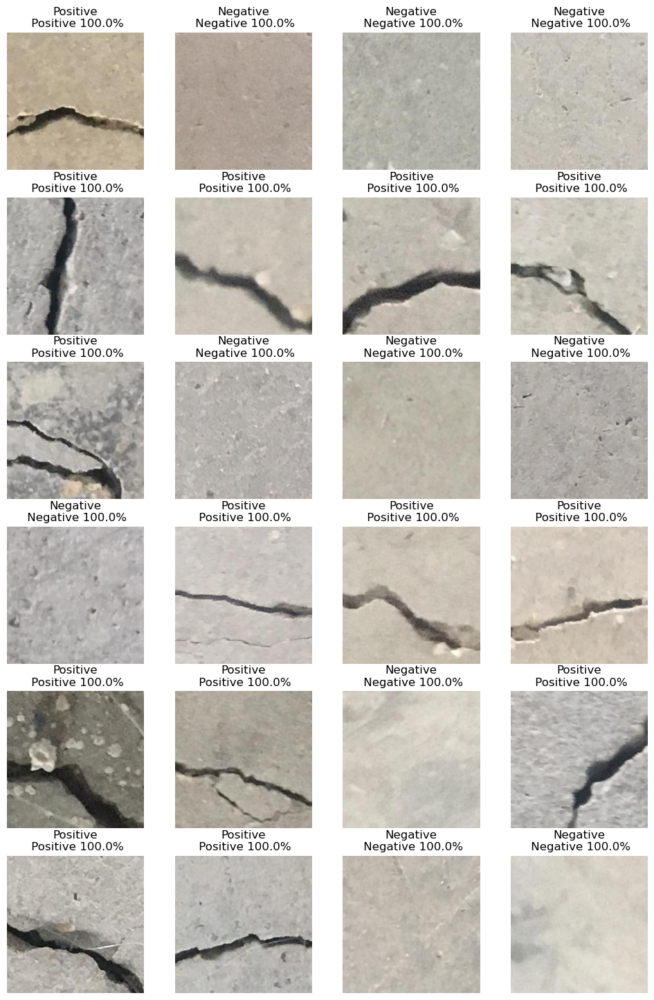

In [57]:
test_generator.reset()
x, y = next(test_generator)
plot_images(x, y, ensemble_preds)

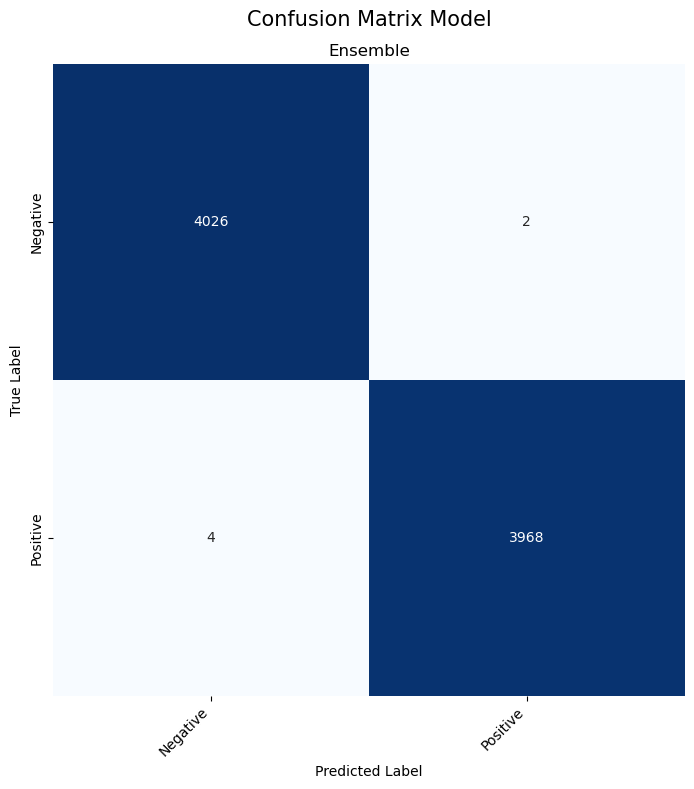

In [59]:
# Display confusion matrix
fig, (ax1) = plt.subplots(1, 1, figsize=(15, 8))

true_classes = test_generator.classes

plot_heatmap(true_classes, predicted_classes, class_names, ax1, title = "Ensemble")        

fig.suptitle("Confusion Matrix Model", fontsize = 15)
fig.tight_layout()
plt.show()